# UNET

In [7]:
# Download dataset from Google Drive
!pip install --upgrade --no-cache-dir gdown -q
!gdown 1MgRnea2nrxhO_UgVG9LH_lQggD6fCCzr

Downloading...
From: https://drive.google.com/uc?id=1MgRnea2nrxhO_UgVG9LH_lQggD6fCCzr
To: /content/dataset.zip
100% 2.30G/2.30G [00:41<00:00, 55.0MB/s]


In [8]:
# Extract the dataset, delete archive
!unzip -q dataset.zip
!rm dataset.zip sample_data -rf

In [9]:
!pip install torchinfo -q

In [10]:
import os
import torch
import matplotlib.pyplot as plt

from pprint import pprint
from torch.utils.data import DataLoader

import cv2
import numpy as np

In [11]:
training_list = os.listdir('dataset2/training')
testing_list = os.listdir('dataset2/testing')

In [12]:
training_samples, testing_samples = len(training_list) // 3, len(testing_list) // 3

In [13]:
training_samples, testing_samples

(1700, 300)

In [14]:
from torch.utils.data import Dataset, random_split
import torchvision.transforms.functional as TF
from PIL import Image
from io import BytesIO

class PortraitSegmentationDataset(Dataset):
    def __init__(self, count, set_path, samples=1000):
        super(PortraitSegmentationDataset, self).__init__()
        self.count = min(count, samples)
        self.set_path = set_path
    
    def __getitem__(self, idx):
        file_name = f"{idx+1:05}"
        image = Image.open(f"{self.set_path}/{file_name}.png")
        mask = Image.open(f"{self.set_path}/{file_name}_matte.png")
        edge = Image.open(f"{self.set_path}/{file_name}_edge.png")

        # resize to 300x400
        image = TF.resize(image, (416, 320))
        mask = TF.resize(mask, (416, 320))
        edge = TF.resize(edge, (416, 320))

        # crop to 296x400
        # image = TF.crop(image, 0, 4, 400, 296)
        # mask = TF.crop(mask, 0, 4, 400, 296)
        # edge = TF.crop(edge, 0, 4, 400, 296)

        image = TF.to_tensor(image)
        mask = TF.to_tensor(mask)
        edge = TF.to_tensor(edge)
        
        # Skip alpha channel
        image = image[0:3, :, :]
        edge = edge[0]

        # Add edge output
        image = torch.cat((image, edge.unsqueeze(dim=0)), dim=0)

        # Only take one channel
        mask = mask[0:1, :, :]

        return image, mask

    def __len__(self):
        return self.count

In [15]:
from torch.utils.data.dataloader import DataLoader
from torch.utils.data import random_split

train_set = PortraitSegmentationDataset(training_samples, "dataset2/training", samples=training_samples)
train_set, val_set = random_split(train_set, [0.85, 0.15])
test_set = PortraitSegmentationDataset(testing_samples, "dataset2/testing", samples=testing_samples)

batch_size = 8
train_loader = DataLoader(train_set, batch_size=batch_size)
val_loader = DataLoader(val_set, batch_size=batch_size)
test_loader = DataLoader(test_set, batch_size=batch_size)

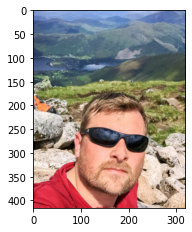

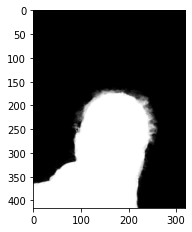

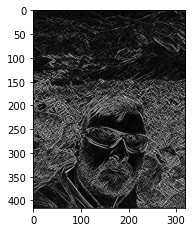

In [16]:
image, mask = train_set[2]

plt.subplot(1,2,1)
plt.imshow(image[0:3, :, :].permute(1, 2, 0))
plt.show()

plt.subplot(1,2,2)
plt.imshow(mask.squeeze(), cmap=plt.get_cmap('gray'))
plt.show()

plt.subplot(1,2,1)
plt.imshow(image[3], cmap=plt.get_cmap('gray'))
plt.show()

In [17]:
image.shape

torch.Size([4, 416, 320])

In [18]:
import torch
import torch.nn as nn
from torchvision import models


class PortUNet(nn.Module):
  def __init__(self):
    super(PortUNet, self).__init__()

    # Define the encoder layers
    self.dense_net = models.densenet121(pretrained=True)
    self.freeze_pretrained_model(False)

    # Define the decoder layers
    self.dec1 = nn.Conv2d(1024+1024, 512, 3, padding=1)
    self.d_bn1 = nn.BatchNorm2d(512)

    self.dec2 = nn.Conv2d(512+512, 256, 5, padding=1)
    self.d_bn2 = nn.BatchNorm2d(256)
    
    self.dec3 = nn.Conv2d(256+256, 128, 5, padding=1)
    self.d_bn3 = nn.BatchNorm2d(128)
    
    self.dec4 = nn.Conv2d(64+128, 16, 7, padding=1)
    self.d_bn4 = nn.BatchNorm2d(16)

    self.dec5 = nn.Conv2d(16+4, 1, 9, padding=4)

  def forward(self, images):
    # Encode the input image
    features = [images[:, 0:3, :, :]]
    for _, layer in self.dense_net.features._modules.items():
        features.append(layer(features[-1]))

    enc6 = features[11]
    enc5 = features[9]
    enc4 = features[7]
    enc3 = features[5]
    enc2 = features[3]
    enc1 = features[0]

    _, _, H, W = enc5.shape
    up1 = nn.functional.interpolate(enc6, size=(H, W), mode='bilinear')
    dec1 = F.relu(self.d_bn1(self.dec1(torch.cat((up1, enc5), dim=1))))

    _, _, H, W = enc4.shape
    up2 = nn.functional.interpolate(dec1, size=(H, W), mode='bilinear')
    dec2 = F.relu(self.d_bn2(self.dec2(torch.cat((up2, enc4), dim=1))))

    _, _, H, W = enc3.shape
    up3 = nn.functional.interpolate(dec2, size=(H, W), mode='bilinear')
    dec3 = F.relu(self.d_bn3(self.dec3(torch.cat((up3, enc3), dim=1))))

    _, _, H, W = enc2.shape
    up4 = nn.functional.interpolate(dec3, size=(H, W), mode='bilinear')
    dec4 = F.relu(self.dec4(torch.cat((up4, enc2), dim=1)))

    _, _, H, W = enc1.shape
    up5 = nn.functional.interpolate(dec4, size=(H, W), mode='bilinear')
    dec5 = torch.sigmoid(self.dec5(torch.cat((images, up5), dim=1)))

    # Return the final decoded image
    # return nn.functional.interpolate(dec5, size=(H, W), mode='bilinear')
    return dec5

  def freeze_pretrained_model(self, freeze: bool):
    for param in self.dense_net.features.parameters():
      param.requires_grad = not freeze

In [19]:
model = PortUNet()

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


  0%|          | 0.00/30.8M [00:00<?, ?B/s]

In [20]:
from torchinfo import summary
summary(model)

Layer (type:depth-idx)                        Param #
PortUNet                                      --
├─DenseNet: 1-1                               --
│    └─Sequential: 2-1                        --
│    │    └─Conv2d: 3-1                       9,408
│    │    └─BatchNorm2d: 3-2                  128
│    │    └─ReLU: 3-3                         --
│    │    └─MaxPool2d: 3-4                    --
│    │    └─_DenseBlock: 3-5                  335,040
│    │    └─_Transition: 3-6                  33,280
│    │    └─_DenseBlock: 3-7                  919,680
│    │    └─_Transition: 3-8                  132,096
│    │    └─_DenseBlock: 3-9                  2,837,760
│    │    └─_Transition: 3-10                 526,336
│    │    └─_DenseBlock: 3-11                 2,158,080
│    │    └─BatchNorm2d: 3-12                 2,048
│    └─Linear: 2-2                            1,025,000
├─Conv2d: 1-2                                 9,437,696
├─BatchNorm2d: 1-3                            1,024
├─

# Losses

In [21]:
import torch.nn.functional as F

def dice_loss_with_sigmoid(sigmoid, targets, smooth=1.0):
	"""
  Works
	sigmoid: (torch.float32)  shape (N, 1, H, W)
	targets: (torch.float32) shape (N, H, W), value {0,1}
	"""
	outputs = torch.squeeze(sigmoid, dim=0)

	inter = outputs * targets
	dice = 1 - ((2*inter.sum(dim=(0,)) + smooth) / (outputs.sum(dim=(0,))+targets.sum(dim=(0,)) + smooth))
	dice = dice.mean()
	return dice 

In [22]:
from torch.optim import SGD, Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Model will train on {device}")
model = model.to(device)

optimizer = SGD(model.parameters(), lr=1e-1, momentum=0.99)
# optimizer = Adam(model.parameters(), lr=0.01)
scheduler = ReduceLROnPlateau(optimizer, mode='min', patience=0, factor=0.9)
loss_func = nn.L1Loss()

Model will train on cuda


- alter batch size (probably 64 or 128) (3rd)
- use learning rate scheduler (4th)
    - changes lr when in plateau
    - step learning rate
- try changing optimizer to SGD (2nd)
- try using Cross entropy (nn.CrossEntropyLoss) (1st)

In [23]:
import time, sys
import matplotlib.pyplot as plt

def train(num_epochs: int, batch_size: int):
    start_time = time.time()

    training_steps = len(train_set) // batch_size
    val_steps = len(val_set) // batch_size

    training_losses = []
    val_losses = []

    best_avg_val_loss = sys.maxsize

    for epoch in range(num_epochs):
        model.train()

        total_training_loss = 0
        total_val_loss = 0

        for i, (images, labels) in enumerate(train_loader, 0):
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            pred = model(images)
            loss = loss_func(pred, labels)

            loss.backward()
            optimizer.step()

            total_training_loss += loss.item()
            scheduler.step(loss.item())
                
        with torch.no_grad():
            model.eval()

            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.to(device)

                pred = model(images)
                total_val_loss += loss_func(pred, labels).item()

        avg_training_loss = total_training_loss / training_steps
        avg_val_loss = total_val_loss / val_steps

        training_losses.append(avg_training_loss)
        val_losses.append(avg_val_loss)

        print(f"{epoch+1}:{i+1} | TrainLoss: {avg_training_loss:.5f} | ValLoss: {avg_val_loss:.5f}")

        torch.cuda.empty_cache()

        if avg_val_loss < best_avg_val_loss:
            torch.save(model.state_dict(), "best_model.pth")
            best_avg_val_loss = avg_val_loss

    end_time = time.time()
    print(f"Total training time: {(end_time - start_time):.5f}s")
    return training_losses, val_losses

In [24]:
training_losses, testing_losses = train(num_epochs=30, batch_size=batch_size)

In [25]:
plt.style.use("ggplot")
plt.figure()
plt.plot(training_losses, label="train_loss")
plt.plot(testing_losses, label="test_loss")
plt.title("Training Loss on Dataset")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="lower left")
plt.savefig("losses.jpg")

# Run tests on best model

# Adding edge details with Image Processing

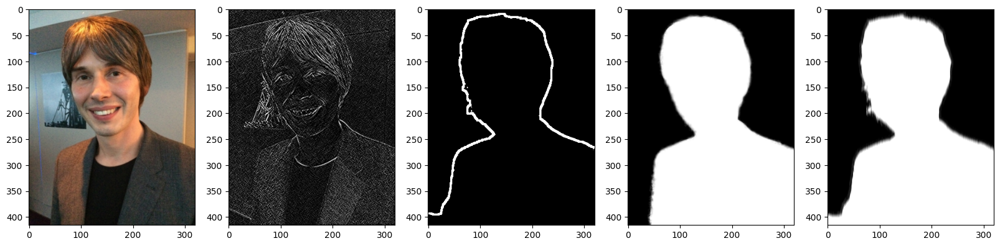

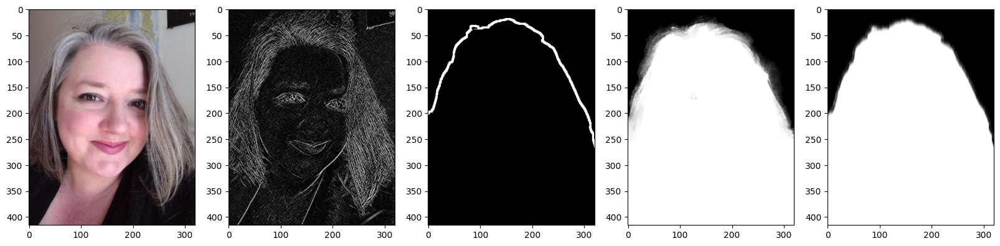

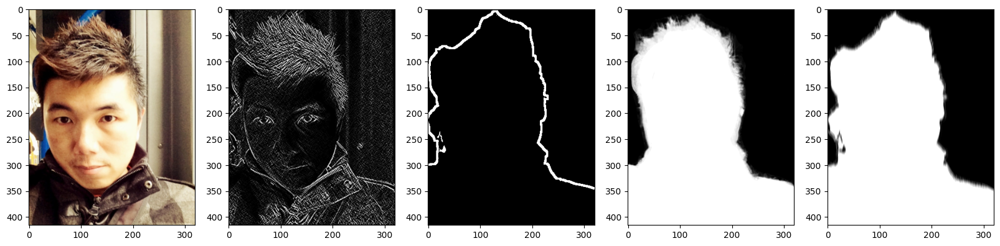

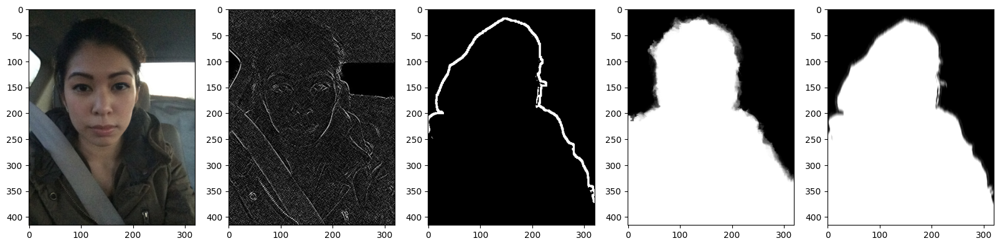

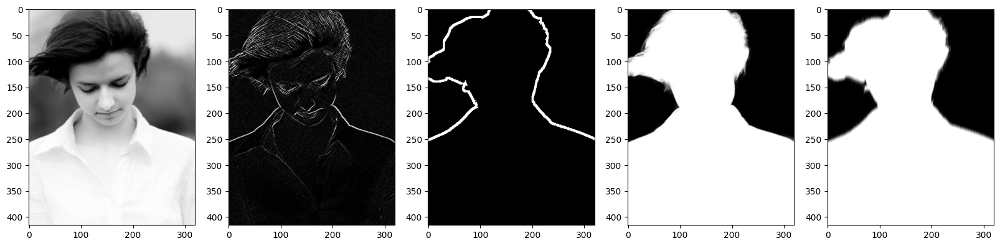

...

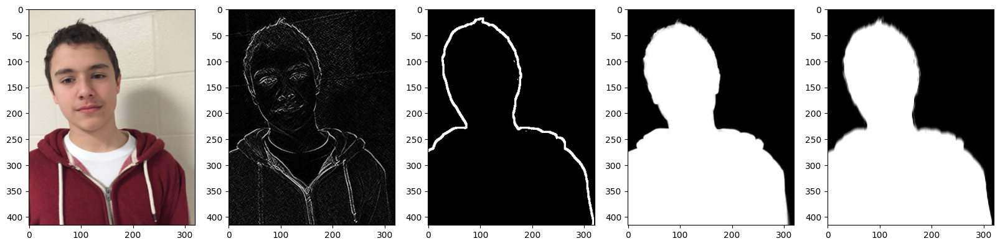

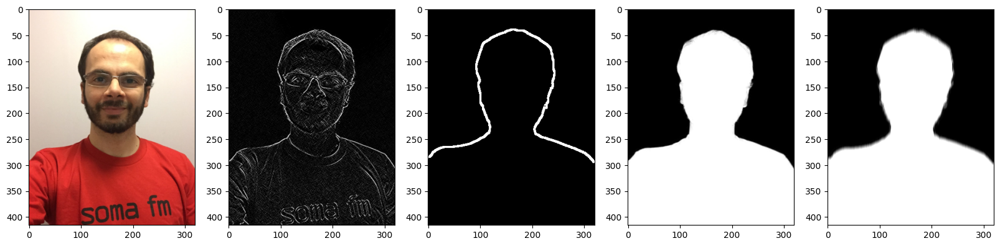

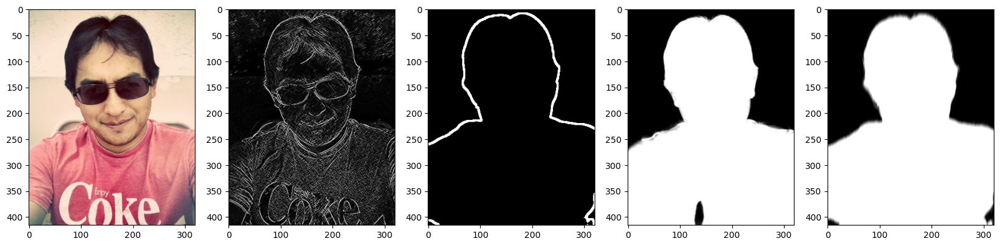

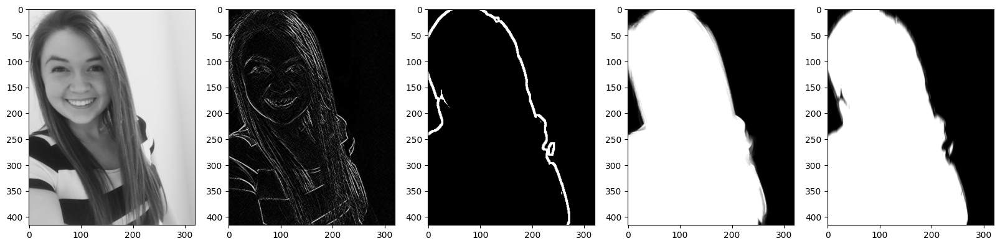

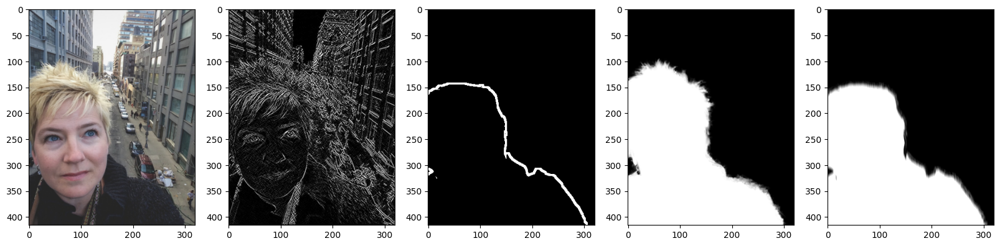

KeyboardInterrupt: ignored

In [29]:
import numpy as np
from PIL import ImageFilter

plt.style.use('default')

y_true = []
y_pred = []

with torch.no_grad():
  best_model.eval()
  for idx, (input_image, output_image) in enumerate(test_loader):
        input_image = input_image.to(device)
        model_output = best_model(input_image)[0]
        model_output = (model_output - model_output.mean()) / model_output.std()
        model_output = np.where(model_output.cpu().numpy() > 0, 1, 0)

        y_true.extend(output_image[0].cpu().numpy().squeeze().flatten().astype(np.uint8))
        y_pred.extend(model_output.squeeze().flatten())

        EDGE_WIDTH = 9

        output_pil = Image.fromarray(np.uint8(model_output.squeeze(0))).convert('RGB')
        border_mask = output_pil.filter(ImageFilter.MaxFilter(size=EDGE_WIDTH))
        border_mask = np.array(border_mask).transpose(2, 0, 1)[0] - model_output.squeeze()

        edges = input_image[0][3]
        model_output = np.where(border_mask, edges.cpu().numpy(), model_output)
        model_output = cv2.GaussianBlur(model_output, (EDGE_WIDTH, EDGE_WIDTH), cv2.BORDER_DEFAULT)
        
        plt.figure(figsize=(20, 10))
        plt.subplot(1, 5, 1)
        plt.imshow(input_image[0][0:3, :, :].cpu().permute(1, 2, 0))
        plt.subplot(1, 5, 2)
        plt.imshow(input_image[0][3].cpu(), cmap=plt.get_cmap('gray'))
        plt.subplot(1, 5, 3)
        plt.imshow(border_mask, cmap=plt.get_cmap('gray'))
        plt.subplot(1, 5, 4)
        plt.imshow(output_image[0].squeeze(), cmap=plt.get_cmap('gray'))
        plt.subplot(1, 5, 5)
        plt.imshow(model_output.squeeze(), cmap=plt.get_cmap('gray'))
        plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, fmt='d', cmap="rocket_r")
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!cp /content/best_model.pth /content/drive/MyDrive/best_model_fdncpp_lr01_2.pth